In [2]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
from tensorflow.keras import models
import cv2

In [3]:
# Check if GPU is enabled
print(tf.__version__)
print(tf.test.gpu_device_name())

2.10.1
/device:GPU:0


In [5]:
# Helper function to download data and extract
def get_data_extract():
  if "food-101" in os.listdir():
    print("Dataset already exists")
  else:
    print("Downloading the data...")
    !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
    print("Dataset downloaded!")
    print("Extracting data..")
    !tar xzvf food-101.tar.gz
    print("Extraction done!")

In [6]:
get_data_extract()

Dataset downloaded!
Extracting data..


--2023-01-14 15:50:03--  http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.vision.ee.ethz.ch/cvl/food-101.tar.gz [following]
--2023-01-14 15:50:04--  https://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4996278331 (4.7G) [application/x-gzip]
Saving to: 'food-101.tar.gz'

     0K .......... .......... .......... .......... ..........  0% 91.5K 14h49m
    50K .......... .......... .......... .......... ..........  0%  183K 11h6m
   100K .......... .......... .......... .......... ..........  0% 43.6M 7h25m
   150K .......... .......... .......... .......... ..........  0%  183K 7h25m
   200K ..........

Extraction done!


x food-101/
x food-101/images/
x food-101/images/beignets/
x food-101/images/beignets/2885220.jpg
x food-101/images/beignets/1814040.jpg
x food-101/images/beignets/81202.jpg
x food-101/images/beignets/1827892.jpg
x food-101/images/beignets/2802124.jpg
x food-101/images/beignets/2192983.jpg
x food-101/images/beignets/250043.jpg
x food-101/images/beignets/2786548.jpg
x food-101/images/beignets/445116.jpg
x food-101/images/beignets/3661460.jpg
x food-101/images/beignets/1064858.jpg
x food-101/images/beignets/2993714.jpg
x food-101/images/beignets/2936669.jpg
x food-101/images/beignets/1062952.jpg
x food-101/images/beignets/2869806.jpg
x food-101/images/beignets/178659.jpg
x food-101/images/beignets/1261083.jpg
x food-101/images/beignets/1296128.jpg
x food-101/images/beignets/3157161.jpg
x food-101/images/beignets/646871.jpg
x food-101/images/beignets/3438314.jpg
x food-101/images/beignets/3019700.jpg
x food-101/images/beignets/1133765.jpg
x food-101/images/beignets/1199143.jpg
x food-101/

In [10]:
ls food-101

 Volume in drive C has no label.
 Volume Serial Number is 04DB-683E

 Directory of c:\Users\tpgus\Documents\VSCodeFiles\food-101

2014-07-09  오후 02:50    <DIR>          .
2014-07-09  오후 02:50    <DIR>          ..
2014-06-22  오후 11:29    <DIR>          images
2014-07-09  오전 02:38               399 license_agreement.txt
2014-04-28  오전 01:54    <DIR>          meta
2014-07-09  오전 02:43               697 README.txt
               2 File(s)          1,096 bytes
               4 Dir(s)  162,070,347,776 bytes free


In [11]:
os.listdir('food-101/images')

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [12]:
os.listdir('food-101/meta')

['classes.txt',
 'labels.txt',
 'test.json',
 'test.txt',
 'train.json',
 'train.txt']

In [15]:
with open('food-101/meta/train.txt') as f:
    for _ in range(10): # first 10 lines
        print(f.readline())

apple_pie/1005649

apple_pie/1014775

apple_pie/1026328

apple_pie/1028787

apple_pie/1043283

apple_pie/1050519

apple_pie/1057749

apple_pie/1057810

apple_pie/1072416

apple_pie/1074856



In [16]:
with open('food-101/meta/classes.txt') as f:
    for _ in range(10): # first 10 lines
        print(f.readline())

apple_pie

baby_back_ribs

baklava

beef_carpaccio

beef_tartare

beet_salad

beignets

bibimbap

bread_pudding

breakfast_burrito



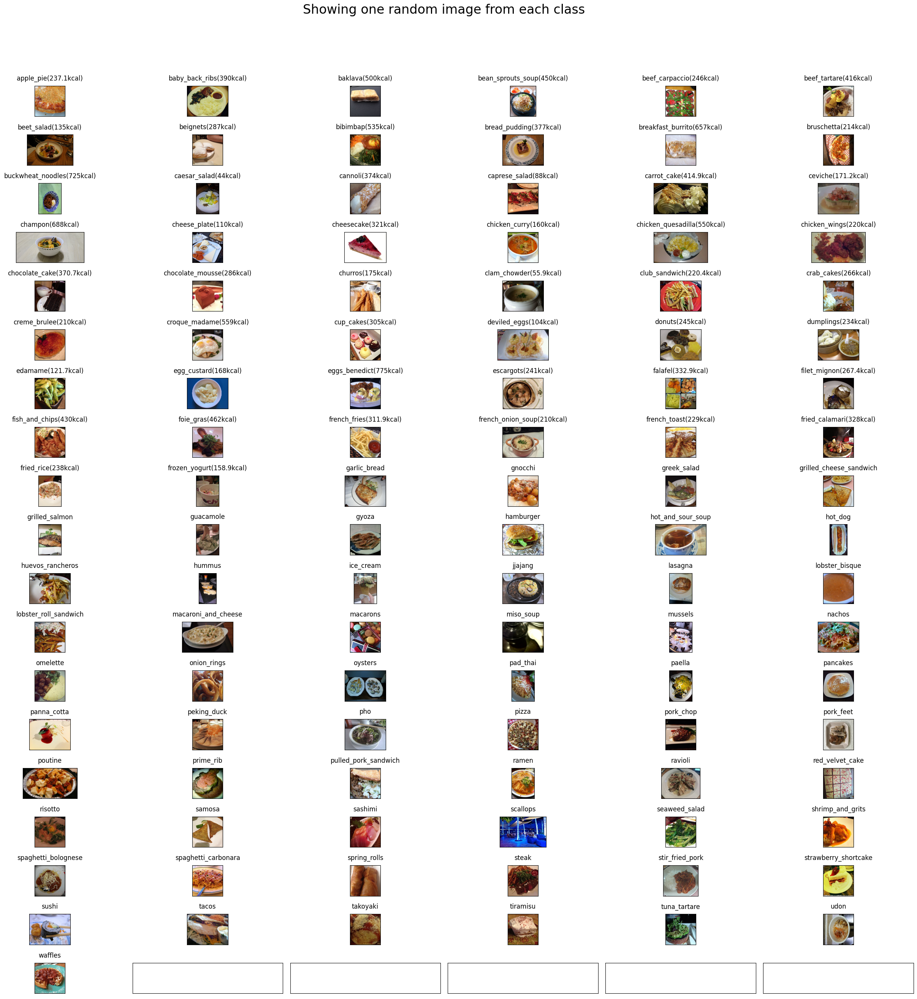

In [4]:
# Visualize the data, showing one image per class from 101 classes
rows = 19
cols = 6
fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
data_dir = "food-101/images/"
foods_sorted = sorted(os.listdir(data_dir))
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id] 
      food_id += 1
    except:
      break
    if food_selected == '.DS_Store':
        continue
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()
# https://matplotlib.org/users/tight_layout_guide.html


In [5]:
foods_sorted

['apple_pie(237.1kcal)',
 'baby_back_ribs(390kcal)',
 'baklava(500kcal)',
 'bean_sprouts_soup(450kcal)',
 'beef_carpaccio(246kcal)',
 'beef_tartare(416kcal)',
 'beet_salad(135kcal)',
 'beignets(287kcal)',
 'bibimbap(535kcal)',
 'bread_pudding(377kcal)',
 'breakfast_burrito(657kcal)',
 'bruschetta(214kcal)',
 'buckwheat_noodles(725kcal)',
 'caesar_salad(44kcal)',
 'cannoli(374kcal)',
 'caprese_salad(88kcal)',
 'carrot_cake(414.9kcal)',
 'ceviche(171.2kcal)',
 'champon(688kcal)',
 'cheese_plate(110kcal)',
 'cheesecake(321kcal)',
 'chicken_curry(160kcal)',
 'chicken_quesadilla(550kcal)',
 'chicken_wings(220kcal)',
 'chocolate_cake(370.7kcal)',
 'chocolate_mousse(286kcal)',
 'churros(175kcal)',
 'clam_chowder(55.9kcal)',
 'club_sandwich(220.4kcal)',
 'crab_cakes(266kcal)',
 'creme_brulee(210kcal)',
 'croque_madame(559kcal)',
 'cup_cakes(305kcal)',
 'deviled_eggs(104kcal)',
 'donuts(245kcal)',
 'dumplings(234kcal)',
 'edamame(121.7kcal)',
 'egg_custard(168kcal)',
 'eggs_benedict(775kcal)',


In [19]:
# Helper method to split dataset into train and test folders
def prepare_data(filepath, src,dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

In [20]:
print("Creating train data...")
prepare_data('food-101/meta/train.txt', 'food-101/images', 'train')

Creating train data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying im

In [22]:
print("Creating test data...")
prepare_data('food-101/meta/test.txt', 'food-101/images', 'test')

Creating test data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying ima

In [6]:
n=109
K.clear_session()
n_classes = n
img_width, img_height = 299, 299
train_data_dir = 'train'
validation_data_dir = 'test'
nb_train_samples = 77036
nb_validation_samples = 25626
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(n,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='best_model.hdf5', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history.log')

history = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=30,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save('model_trained.hdf5')


Found 77036 images belonging to 109 classes.
Found 25626 images belonging to 109 classes.


c:\Users\tpgus\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\optimizers\optimizer_v2\gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
C:\Users\tpgus\AppData\Local\Temp\ipykernel_40796\3343267029.py:45: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,


Epoch 1/30
4814/4814 [==============================] - ETA: 0s - loss: 4.8808 - accuracy: 0.0954
Epoch 1: val_loss improved from inf to 3.91022, saving model to best_model.hdf5
4814/4814 [==============================] - 1206s 248ms/step - loss: 4.8808 - accuracy: 0.0954 - val_loss: 3.9102 - val_accuracy: 0.3174
Epoch 2/30
4814/4814 [==============================] - ETA: 0s - loss: 3.6582 - accuracy: 0.3082
Epoch 2: val_loss improved from 3.91022 to 2.56641, saving model to best_model.hdf5
4814/4814 [==============================] - 1188s 247ms/step - loss: 3.6582 - accuracy: 0.3082 - val_loss: 2.5664 - val_accuracy: 0.5365
Epoch 3/30
4814/4814 [==============================] - ETA: 0s - loss: 2.8786 - accuracy: 0.4416
Epoch 3: val_loss improved from 2.56641 to 1.99584, saving model to best_model.hdf5
4814/4814 [==============================] - 1187s 247ms/step - loss: 2.8786 - accuracy: 0.4416 - val_loss: 1.9958 - val_accuracy: 0.6354
Epoch 4/30
4814/4814 [======================

In [7]:
class_map_101 = train_generator.class_indices
class_map_101

{'apple_pie': 0,
 'baby_back_ribs': 1,
 'baklava': 2,
 'bean_sprouts_soup': 3,
 'beef_carpaccio': 4,
 'beef_tartare': 5,
 'beet_salad': 6,
 'beignets': 7,
 'bibimbap': 8,
 'bread_pudding': 9,
 'breakfast_burrito': 10,
 'bruschetta': 11,
 'buckwheat_noodles': 12,
 'caesar_salad': 13,
 'cannoli': 14,
 'caprese_salad': 15,
 'carrot_cake': 16,
 'ceviche': 17,
 'champon': 18,
 'cheese_plate': 19,
 'cheesecake': 20,
 'chicken_curry': 21,
 'chicken_quesadilla': 22,
 'chicken_wings': 23,
 'chocolate_cake': 24,
 'chocolate_mousse': 25,
 'churros': 26,
 'clam_chowder': 27,
 'club_sandwich': 28,
 'crab_cakes': 29,
 'creme_brulee': 30,
 'croque_madame': 31,
 'cup_cakes': 32,
 'deviled_eggs': 33,
 'donuts': 34,
 'dumplings': 35,
 'edamame': 36,
 'egg_custard': 37,
 'eggs_benedict': 38,
 'escargots': 39,
 'falafel': 40,
 'filet_mignon': 41,
 'fish_and_chips': 42,
 'foie_gras': 43,
 'french_fries': 44,
 'french_onion_soup': 45,
 'french_toast': 46,
 'fried_calamari': 47,
 'fried_rice': 48,
 'frozen_y

In [8]:
def plot_accuracy(history,title):
    plt.title(title)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train_accuracy', 'validation_accuracy'], loc='best')
    plt.show()
def plot_loss(history,title):
    plt.title(title)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='best')
    plt.show()

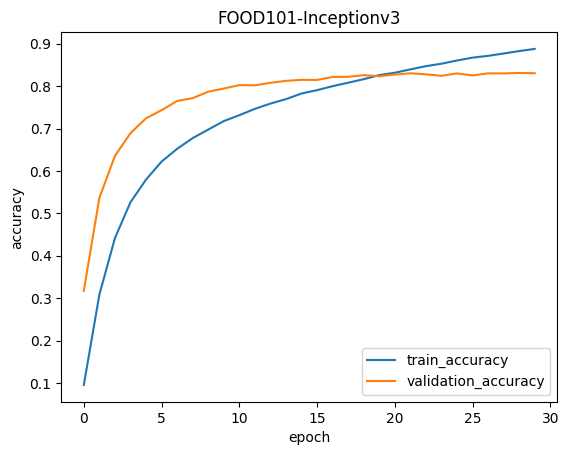

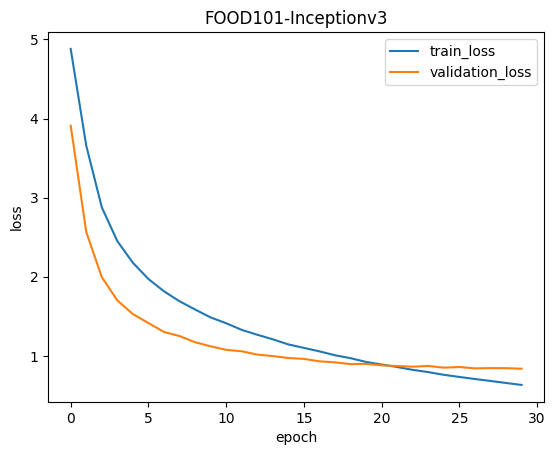

In [9]:
plot_accuracy(history,'FOOD101-Inceptionv3')
plot_loss(history,'FOOD101-Inceptionv3')